<a href="https://colab.research.google.com/github/suryautharakumar/CMP7005_Programming_for_Data_Analysis/blob/main/final_assignment_das7000_data_analytics_and_visualisation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### **Dataset Link** -[https://catalog.data.gov/dataset/consumer-airfare-report-table-2-top-1000-city-pair-markets](https://catalog.data.gov/dataset/consumer-airfare-report-table-2-top-1000-city-pair-markets)

## **Introduction**
A dataset containing airfare and passenger statistics for the air travel markets, including fare, yield, distance, passenger volume, and year on year comparison values, useful for trend analysis and market insights.

In [1]:
#importing required libraries
import pandas as pd
import os
import glob
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns

In [2]:
#Load dataset from GitHub
df = pd.read_csv("https://raw.githubusercontent.com/suryautharakumar/DAS7000_Data_Analytics_and_Visualisation/refs/heads/main/Consumer_Airfare_Report__Table_2_-_Top_1_000_City-Pair_Markets.csv")

print("Dataset loaded successfully!\n")
print("Shape of dataset:", df.shape)

Dataset loaded successfully!

Shape of dataset: (8509, 16)


### **Data Understanding**

In [3]:
df.head()

,tbl,Year,quarter,citymarketid,city,markets,cur_passengers,cur_fare,cur_yield,distance,ly_passengers,ly_fare,ly_yield,ly_distance,Geocoded_City,tbl2pk
0,Table 2,2021,4,34576,"Rochester, NY",7,170560,162.92,25.13,648.2,42450.0,150.54,19.47,773.4,NaN,2021434576
1,Table 2,2021,4,33495,"New Orleans, LA",30,1571520,186.78,18.88,989.5,656740.0,150.32,14.74,1019.7,NaN,2021433495
2,Table 2,2021,4,32337,"Indianapolis, IN",25,1246520,206.51,19.79,1043.7,570540.0,164.68,15.26,1079.1,NaN,2021432337
3,Table 2,2021,4,33214,"San Antonio, TX",30,1219290,207.84,18.36,1131.7,530200.0,185.53,16.06,1155.0,NaN,2021433214
4,Table 2,2021,4,32600,"Little Rock, AR",7,126870,191.80,23.06,831.6,68150.0,166.98,18.49,902.9,NaN,2021432600


In [4]:
#Dataset Shapes & Data Types
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8509 entries, 0 to 8508
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   tbl             8509 non-null   object 
 1   Year            8509 non-null   int64  
 2   quarter         8509 non-null   int64  
 3   citymarketid    8509 non-null   int64  
 4   city            8509 non-null   object 
 5   markets         8509 non-null   int64  
 6   cur_passengers  8509 non-null   int64  
 7   cur_fare        8509 non-null   float64
 8   cur_yield       8509 non-null   float64
 9   distance        8509 non-null   float64
 10  ly_passengers   8506 non-null   float64
 11  ly_fare         8506 non-null   float64
 12  ly_yield        8506 non-null   float64
 13  ly_distance     8506 non-null   float64
 14  Geocoded_City   6701 non-null   object 
 15  tbl2pk          8509 non-null   int64  
dtypes: float64(7), int64(6), object(3)
memory usage: 1.0+ MB


In [5]:
#Find Missing Values
print(df.isna().sum())

tbl                  0
Year                 0
quarter              0
citymarketid         0
city                 0
markets              0
cur_passengers       0
cur_fare             0
cur_yield            0
distance             0
ly_passengers        3
ly_fare              3
ly_yield             3
ly_distance          3
Geocoded_City     1808
tbl2pk               0
dtype: int64


In [6]:
df.columns

Index(['tbl', 'Year', 'quarter', 'citymarketid', 'city', 'markets',
       'cur_passengers', 'cur_fare', 'cur_yield', 'distance', 'ly_passengers',
       'ly_fare', 'ly_yield', 'ly_distance', 'Geocoded_City', 'tbl2pk'],
      dtype='object')

In [7]:
years = df['Year'].value_counts()
print(f'Total number of unique years in the dataset : {len(years)}')
years.sort_index(ascending=True)

Total number of unique years in the dataset : 30


,count
Year,
1996,276
1997,281
1998,288
1999,291
2000,289
2001,276
2002,281
2003,283
2004,284


In [8]:
cities = df['city'].value_counts()
print(f'Total number of unique cities in the dataset : {len(cities)}')
cities

Total number of unique cities in the dataset : 102


,count
city,
"New Orleans, LA",118
"Indianapolis, IN",118
"San Antonio, TX",118
"Columbus, OH",118
"Hartford, CT",118
...,...
"Trenton, NJ",2
"Fayetteville, AR",2
"Wichita, KS",1


In [9]:
df['city'].unique() #unique city name in dataset

array(['Rochester, NY', 'New Orleans, LA', 'Indianapolis, IN',
       'San Antonio, TX', 'Little Rock, AR', 'Albuquerque, NM',
       'Denver, CO', 'Hartford, CT', 'Columbus, OH',
       'Greenville/Spartanburg, SC', 'St. Louis, MO',
       'Cleveland, OH (Metropolitan Area)',
       'Washington, DC (Metropolitan Area)', 'San Diego, CA',
       'Houston, TX', 'West Palm Beach/Palm Beach, FL',
       'Colorado Springs, CO', 'Syracuse, NY',
       'Atlanta, GA (Metropolitan Area)', 'Oklahoma City, OK',
       'Des Moines, IA', 'Spokane, WA', 'Salt Lake City, UT',
       'Chicago, IL', 'Fresno, CA', 'Palm Springs, CA', 'Phoenix, AZ',
       'Memphis, TN', 'El Paso, TX', 'Las Vegas, NV',
       'Sarasota/Bradenton, FL', 'Dallas/Fort Worth, TX', 'Key West, FL',
       'Minneapolis/St. Paul, MN', 'Los Angeles, CA (Metropolitan Area)',
       'Philadelphia, PA', 'Boston, MA (Metropolitan Area)',
       'Charleston, SC', 'Miami, FL (Metropolitan Area)', 'Pensacola, FL',
       'Detroit, MI', '

<Axes: >

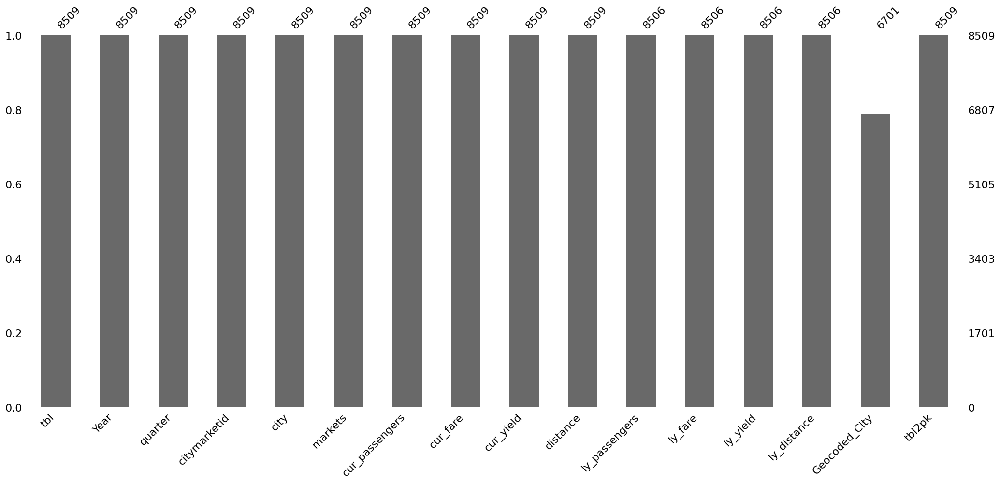

In [10]:
import missingno as msno

msno.bar(df)

Data cleaning & preprocessing

In [11]:
df.columns

Index(['tbl', 'Year', 'quarter', 'citymarketid', 'city', 'markets',
       'cur_passengers', 'cur_fare', 'cur_yield', 'distance', 'ly_passengers',
       'ly_fare', 'ly_yield', 'ly_distance', 'Geocoded_City', 'tbl2pk'],
      dtype='object')

In [12]:
df.columns = [c.strip().lower().replace(" ", "_") for c in df.columns]
df.columns

Index(['tbl', 'year', 'quarter', 'citymarketid', 'city', 'markets',
       'cur_passengers', 'cur_fare', 'cur_yield', 'distance', 'ly_passengers',
       'ly_fare', 'ly_yield', 'ly_distance', 'geocoded_city', 'tbl2pk'],
      dtype='object')

In [13]:
from sklearn.impute import SimpleImputer
import numpy as np

imputer = SimpleImputer(strategy='median')

df[['ly_passengers','ly_fare','ly_yield','ly_distance']] = imputer.fit_transform(
    df[['ly_passengers','ly_fare','ly_yield','ly_distance']]
)

In [14]:
df['geocoded_city'] = df['geocoded_city'].fillna("Unknown")

In [15]:
df.isna().sum()

,0
tbl,0
year,0
quarter,0
citymarketid,0
city,0
markets,0
cur_passengers,0
cur_fare,0
cur_yield,0
distance,0


<Axes: >

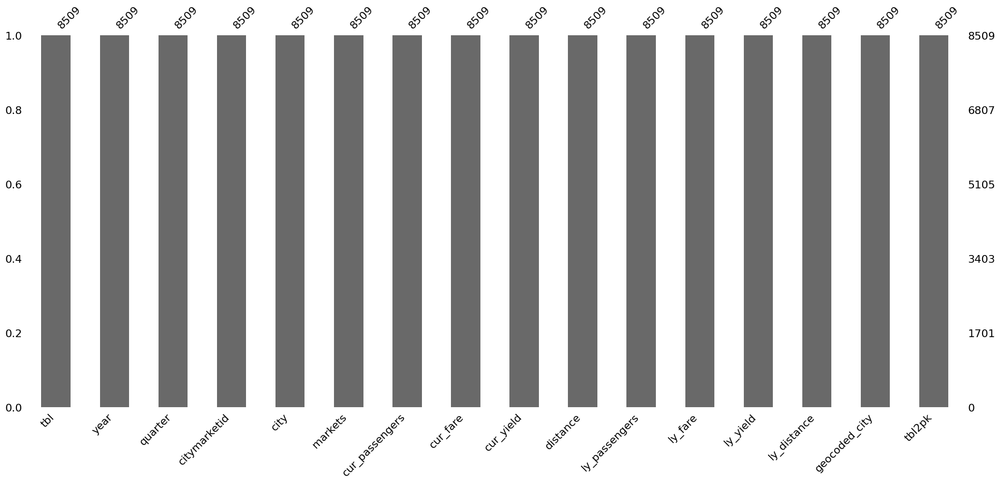

In [16]:
import missingno as msno

msno.bar(df)

Feature Engineering

In [17]:
#Passenger Growth (YoY)
df['passenger_growth'] = (df['cur_passengers'] - df['ly_passengers']) / df['ly_passengers']

In [18]:
#Fare Change (YoY)
df['fare_change'] = (df['cur_fare'] - df['ly_fare']) / df['ly_fare']

In [19]:
#Yield Change (YoY)
df['yield_change'] = (df['cur_yield'] - df['ly_yield']) / df['ly_yield']

In [20]:
#Revenue Proxies
df['cur_revenue'] = df['cur_passengers'] * df['cur_fare']
df['ly_revenue']  = df['ly_passengers'] * df['ly_fare']

In [21]:
#Revenue Growth
df['revenue_growth'] = (df['cur_revenue'] - df['ly_revenue']) / df['ly_revenue']

In [22]:
city_lat_long = {
    "Rochester, NY": (43.1566, -77.6088),
    "New Orleans, LA": (29.9511, -90.0715),
    "Indianapolis, IN": (39.7684, -86.1581),
    "San Antonio, TX": (29.4241, -98.4936),
    "Little Rock, AR": (34.7465, -92.2896),
    "Albuquerque, NM": (35.0844, -106.6504),
    "Denver, CO": (39.7392, -104.9903),
    "Hartford, CT": (41.7658, -72.6734),
    "Columbus, OH": (39.9612, -82.9988),
    "Greenville/Spartanburg, SC": (34.8526, -82.3940),
    "St. Louis, MO": (38.6270, -90.1994),
    "Cleveland, OH (Metropolitan Area)": (41.4993, -81.6944),
    "Washington, DC (Metropolitan Area)": (38.9072, -77.0369),
    "San Diego, CA": (32.7157, -117.1611),
    "Houston, TX": (29.7604, -95.3698),
    "West Palm Beach/Palm Beach, FL": (26.7153, -80.0534),
    "Colorado Springs, CO": (38.8339, -104.8214),
    "Syracuse, NY": (43.0481, -76.1474),
    "Atlanta, GA (Metropolitan Area)": (33.7490, -84.3880),
    "Oklahoma City, OK": (35.4676, -97.5164),
    "Des Moines, IA": (41.5868, -93.6250),
    "Spokane, WA": (47.6588, -117.4260),
    "Salt Lake City, UT": (40.7608, -111.8910),
    "Chicago, IL": (41.8781, -87.6298),
    "Fresno, CA": (36.7378, -119.7871),
    "Palm Springs, CA": (33.8303, -116.5453),
    "Phoenix, AZ": (33.4484, -112.0740),
    "Memphis, TN": (35.1495, -90.0490),
    "El Paso, TX": (31.7619, -106.4850),
    "Las Vegas, NV": (36.1699, -115.1398),
    "Sarasota/Bradenton, FL": (27.3364, -82.5307),
    "Dallas/Fort Worth, TX": (32.7767, -96.7970),
    "Key West, FL": (24.5551, -81.7800),
    "Minneapolis/St. Paul, MN": (44.9778, -93.2650),
    "Los Angeles, CA (Metropolitan Area)": (34.0522, -118.2437),
    "Philadelphia, PA": (39.9526, -75.1652),
    "Boston, MA (Metropolitan Area)": (42.3601, -71.0589),
    "Charleston, SC": (32.7765, -79.9311),
    "Miami, FL (Metropolitan Area)": (25.7617, -80.1918),
    "Pensacola, FL": (30.4213, -87.2169),
    "Detroit, MI": (42.3314, -83.0458),
    "Tulsa, OK": (36.15398, -95.992775),
    "Birmingham, AL": (33.5186, -86.8104),
    "Omaha, NE": (41.2565, -95.9345),
    "Sacramento, CA": (38.5816, -121.4944),
    "Austin, TX": (30.2672, -97.7431),
    "Grand Rapids, MI": (42.9634, -85.6681),
    "Raleigh/Durham, NC": (35.7796, -78.6382),
    "Pittsburgh, PA": (40.4406, -79.9959),
    "New York City, NY (Metropolitan Area)": (40.7128, -74.0060),
    "Cincinnati, OH": (39.1031, -84.5120),
    "Punta Gorda, FL": (26.9298, -82.0454),
    "Buffalo, NY": (42.8864, -78.8784),
    "Tampa, FL (Metropolitan Area)": (27.9506, -82.4572),
    "Richmond, VA": (37.5407, -77.4360),
    "Boise, ID": (43.6150, -116.2023),
    "Eugene, OR": (44.0521, -123.0868),
    "Seattle, WA": (47.6062, -122.3321),
    "Savannah, GA": (32.0809, -81.0912),
    "San Francisco, CA (Metropolitan Area)": (37.7749, -122.4194),
    "Greensboro/High Point, NC": (36.0726, -79.7920),
    "Jacksonville, FL": (30.3322, -81.6557),
    "Milwaukee, WI": (43.0389, -87.9065),
    "Charlotte, NC": (35.2271, -80.8431),
    "Tucson, AZ": (32.2226, -110.9747),
    "Knoxville, TN": (35.9606, -83.9207),
    "Norfolk, VA (Metropolitan Area)": (36.8508, -76.2859),
    "Fort Myers, FL": (26.6406, -81.8723),
    "Orlando, FL": (28.5383, -81.3792),
    "Kansas City, MO": (39.0997, -94.5786),
    "Bozeman, MT": (45.6770, -111.0429),
    "Albany, NY": (42.6526, -73.7562),
    "Louisville, KY": (38.2527, -85.7585),
    "Nashville, TN": (36.1627, -86.7816),
    "Reno, NV": (39.5296, -119.8138),
    "Portland, OR": (45.5152, -122.6784),
    "Madison, WI": (43.0731, -89.4012),
    "Portland, ME": (43.6591, -70.2568),
    "Sanford, FL": (28.8029, -81.2695),
    "Myrtle Beach, SC": (33.6891, -78.8867),
    "Midland/Odessa, TX": (31.9973, -102.0779),
    "Dayton, OH": (39.7589, -84.1916),
    "Lubbock, TX": (33.5779, -101.8552),
    "Bellingham, WA": (48.7491, -122.4781),
    "Atlantic City, NJ": (39.3643, -74.4229),
    "Jackson/Vicksburg, MS": (32.2988, -90.1848),
    "Amarillo, TX": (35.221997, -101.831299),
    "Harlingen/San Benito, TX": (26.1906, -97.6961),
    "Flint, MI": (43.0125, -83.6875),
    "Panama City, FL": (30.1588, -85.6602),
    "Burlington, VT": (44.4759, -73.2121),
    "Wichita, KS": (37.6872, -97.3301),
    "Everett, WA": (47.9789, -122.2021),
    "Valparaiso, FL": (30.5080, -86.5027),
    "Tallahassee, FL": (30.4383, -84.2807),
    "Trenton, NJ": (40.2171, -74.7429),
    "Santa Barbara, CA": (34.4208, -119.6982),
    "New Haven, CT": (41.3083, -72.9279),
    "Asheville, NC": (35.5951, -82.5515),
    "Fayetteville, AR": (36.0626, -94.1574),
    "Provo, UT": (40.2338, -111.6585),
    "Appleton, WI": (44.2619, -88.4154)
}


In [23]:
#Create latitude & longitude columns from stored dictionary
df["latitude"]  = df["city"].map(lambda x: city_lat_long.get(x,(None,None))[0])
df["longitude"] = df["city"].map(lambda x: city_lat_long.get(x,(None,None))[1])

#Extract state abbreviation
df["state"] = df["city"].str.extract(r',\s*([A-Z]{2})')

In [24]:
df.head()

,tbl,year,quarter,citymarketid,city,markets,cur_passengers,cur_fare,cur_yield,distance,...,tbl2pk,passenger_growth,fare_change,yield_change,cur_revenue,ly_revenue,revenue_growth,latitude,longitude,state
0,Table 2,2021,4,34576,"Rochester, NY",7,170560,162.92,25.13,648.2,...,2021434576,3.017903,0.082237,0.290704,27787635.2,6390423.0,3.348325,43.1566,-77.6088,NY
1,Table 2,2021,4,33495,"New Orleans, LA",30,1571520,186.78,18.88,989.5,...,2021433495,1.392910,0.242549,0.280868,293528505.6,98721156.8,1.973309,29.9511,-90.0715,LA
2,Table 2,2021,4,32337,"Indianapolis, IN",25,1246520,206.51,19.79,1043.7,...,2021432337,1.184807,0.254008,0.296855,257418845.2,93956527.2,1.739765,39.7684,-86.1581,IN
3,Table 2,2021,4,33214,"San Antonio, TX",30,1219290,207.84,18.36,1131.7,...,2021433214,1.299679,0.120250,0.143213,253417233.6,98368006.0,1.576216,29.4241,-98.4936,TX
4,Table 2,2021,4,32600,"Little Rock, AR",7,126870,191.80,23.06,831.6,...,2021432600,0.861629,0.148641,0.247161,24333666.0,11379687.0,1.138342,34.7465,-92.2896,AR


In [25]:
print(f"There are '{df.duplicated().sum()}' duplicates in the dataset")

There are '0' duplicates in the dataset


In [26]:
df.info()
df.describe().T
df.isna().sum()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8509 entries, 0 to 8508
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   tbl               8509 non-null   object 
 1   year              8509 non-null   int64  
 2   quarter           8509 non-null   int64  
 3   citymarketid      8509 non-null   int64  
 4   city              8509 non-null   object 
 5   markets           8509 non-null   int64  
 6   cur_passengers    8509 non-null   int64  
 7   cur_fare          8509 non-null   float64
 8   cur_yield         8509 non-null   float64
 9   distance          8509 non-null   float64
 10  ly_passengers     8509 non-null   float64
 11  ly_fare           8509 non-null   float64
 12  ly_yield          8509 non-null   float64
 13  ly_distance       8509 non-null   float64
 14  geocoded_city     8509 non-null   object 
 15  tbl2pk            8509 non-null   int64  
 16  passenger_growth  8509 non-null   float64


,0
tbl,0
year,0
quarter,0
citymarketid,0
city,0
markets,0
cur_passengers,0
cur_fare,0
cur_yield,0
distance,0


In [27]:
df.to_csv("cleaned_airfare.csv", index=False)

Exploratory Data Analysis (EDA)

Univariate Analysis (Single Variable EDA)

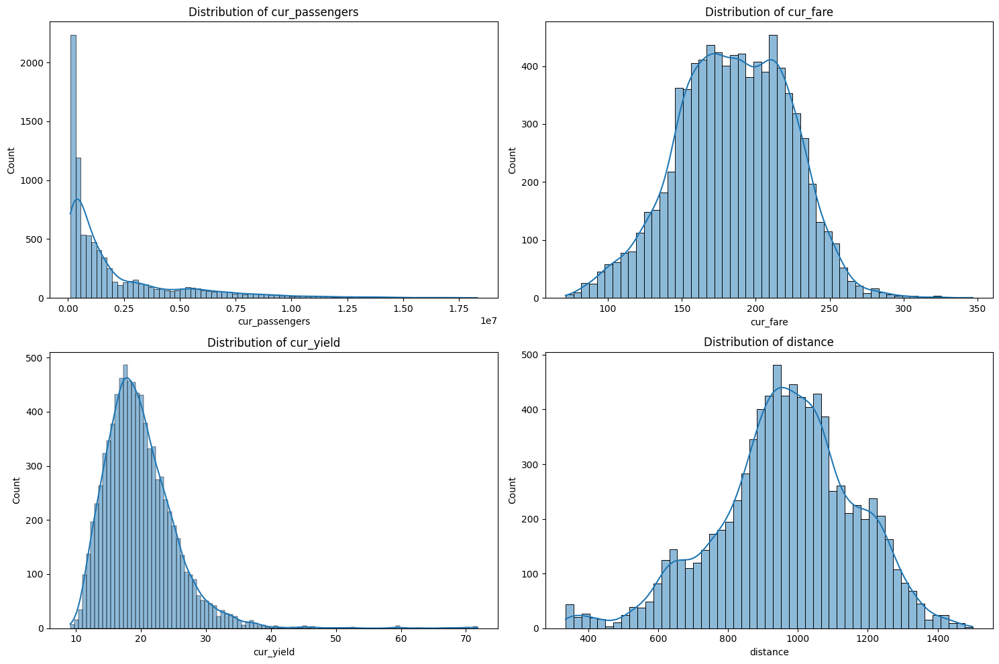

In [28]:
#Numerical Columns Distribution
num_cols = ['cur_passengers','cur_fare','cur_yield','distance']

plt.figure(figsize=(15,10))
for i, col in enumerate(num_cols, 1):
    plt.subplot(2,2,i)
    sns.histplot(df[col], kde=True)
    plt.title(f"Distribution of {col}")
plt.tight_layout()
plt.show()


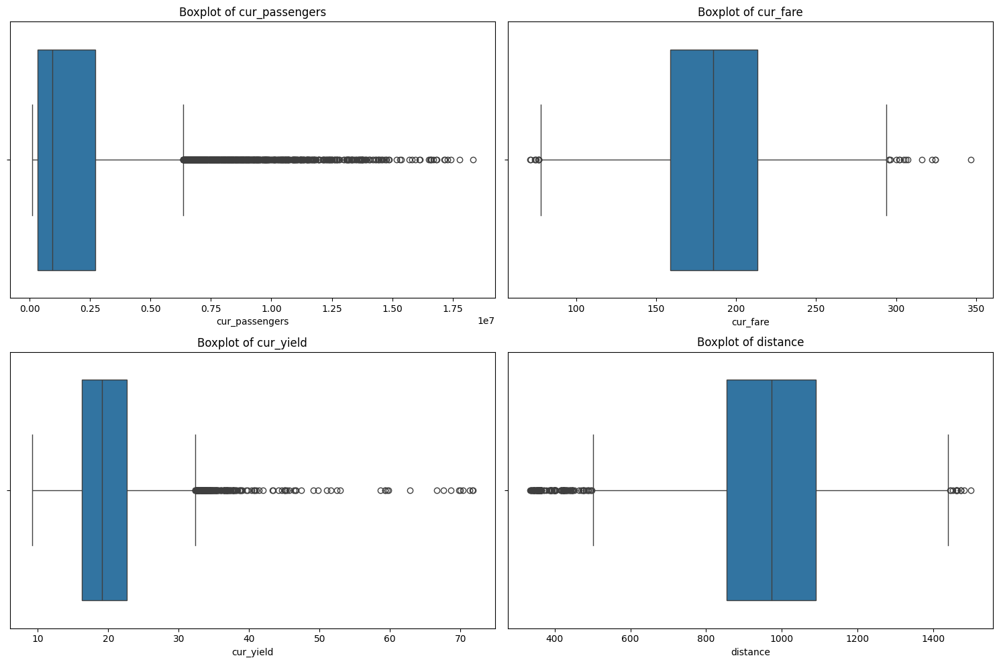

In [29]:
#b
plt.figure(figsize=(15,10))
for i, col in enumerate(num_cols, 1):
    plt.subplot(2,2,i)
    sns.boxplot(x=df[col])
    plt.title(f"Boxplot of {col}")
plt.tight_layout()
plt.show()

Categorical Columns Distribution

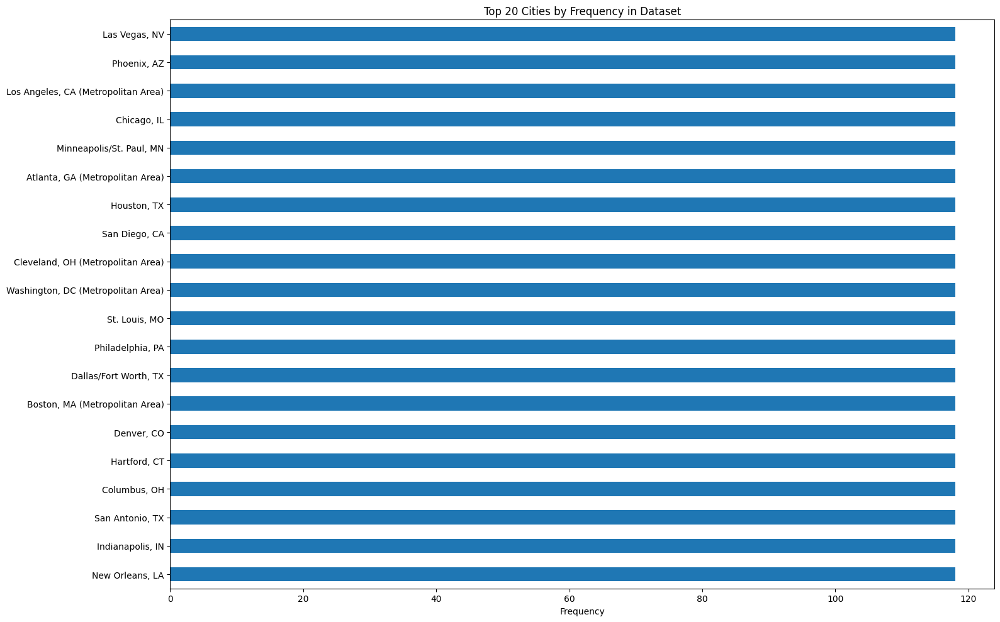

In [30]:
#City Frequency (Top 20 Cities)
df['city'].value_counts().head(20).plot(kind='barh', figsize=(16,10))
plt.title("Top 20 Cities by Frequency in Dataset")
plt.xlabel("Frequency")
plt.ylabel("")
plt.tight_layout()
plt.show()

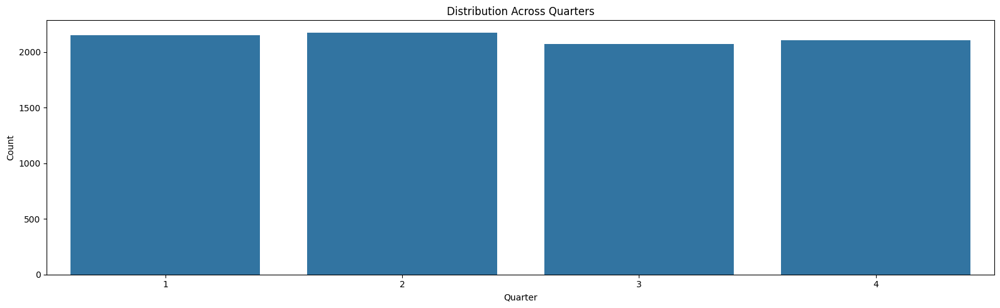

In [31]:
plt.figure(figsize=(16, 5))
sns.countplot(data=df, x='quarter')
plt.title("Distribution Across Quarters")
plt.xlabel("Quarter")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

Bivariate Analysis (Two-Variable EDA)

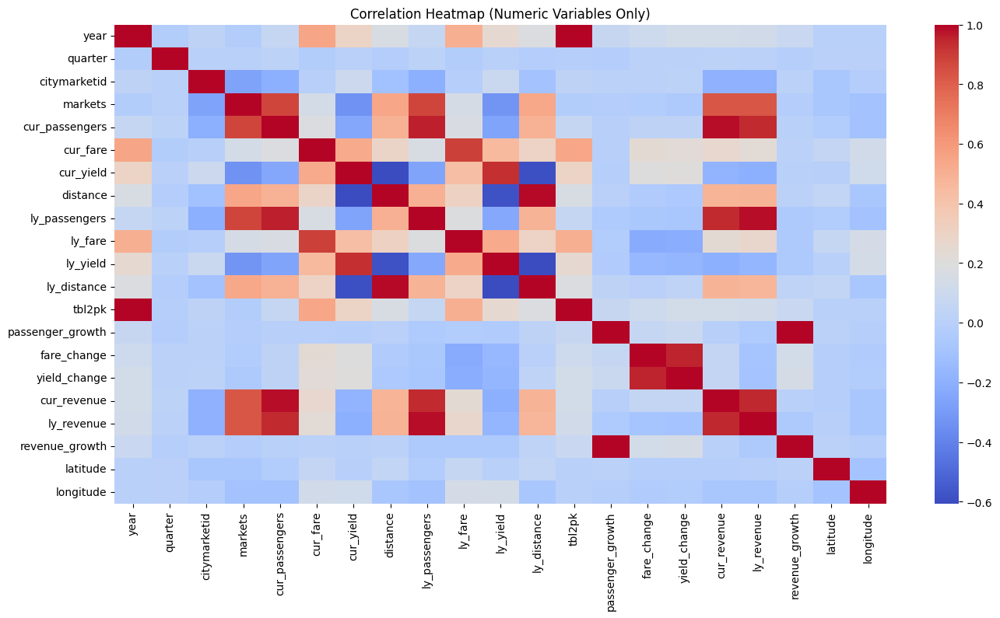

In [32]:
# Select only numeric columns
numeric_df = df.select_dtypes(include=['int64','float64'])

plt.figure(figsize=(16,8))
sns.heatmap(numeric_df.corr(), annot=False, cmap='coolwarm')
plt.title("Correlation Heatmap (Numeric Variables Only)")
plt.show()

In [33]:
fig = px.scatter(df, x='distance', y='cur_fare',
                 color='year',
                 size='cur_passengers',
                 hover_data=df.columns,
                 title="Distance vs Fare (Interactive)")
fig.show()

In [34]:
px.scatter(df, x='cur_passengers', y='cur_fare',
           color='quarter', hover_data=df.columns,
           title="Passengers vs Fare").show()

In [35]:
px.scatter(df, x='distance', y='cur_revenue',
           color='year',
           hover_data=df.columns,
           title="Revenue vs Distance").show()

In [36]:
#Bubble Charts
fig = px.scatter(df,
                 x='distance',
                 y='cur_fare',
                 size='cur_passengers',
                 color='year',
                 hover_data=df.columns,
                 title="Bubble Chart: Fare vs Distance vs Passengers")

fig.show()

Yearly Trends (Interactive Line Charts)

In [37]:
#Yearly Average Fare
yearly_fare = df.groupby('year')['cur_fare'].mean().reset_index()

fig = px.line(yearly_fare, x='year', y='cur_fare',
              markers=True,
              hover_data=yearly_fare.columns,
              title="Yearly Average Fare Trend")
fig.show()

In [38]:
#Yearly Passenger Trend
yearly_pass = df.groupby('year')['cur_passengers'].sum().reset_index()

fig = px.line(yearly_pass, x='year', y='cur_passengers',
              markers=True,
              hover_data=yearly_pass.columns,
              title="Total Passengers Over Time")
fig.show()

Scatter Map - Market Locations Based on Traffic

In [39]:
state_fare = df.groupby('state')['cur_fare'].mean().reset_index()

fig = px.choropleth(state_fare,
                    locations='state',
                    locationmode="USA-states",
                    color='cur_fare',
                    scope="usa",
                    hover_data=['cur_fare'],
                    title="Average Airfare by State")
fig.show()

In [40]:
fig = px.scatter_geo(df,
                     lat='latitude', lon='longitude',
                     size='cur_revenue',
                     color='cur_revenue',
                     hover_name='city',
                     scope="usa",
                     title="Revenue Bubble Map — Key Revenue Markets")
fig.show()

In [41]:
fig = px.scatter_matrix(df,
                        dimensions=['cur_passengers','cur_fare','cur_yield','distance','cur_revenue'],
                        color='year')
fig.update_layout(title="Interactive Scatter Matrix — Relationship View")
fig.show()

In [42]:
fig = px.violin(df, y="cur_fare", x="quarter",
                box=True, points="all",
                hover_data=df.columns,
                title="Fare Distribution Across Quarters")
fig.show()

In [43]:
fig = px.scatter(df,
                 x='distance', y='cur_fare',
                 animation_frame='year',
                 size='cur_passengers',
                 color='state',
                 hover_data=df.columns,
                 title="Distance vs Fare — Yearly Movement Animation")
fig.show()

In [45]:
import plotly.graph_objects as go

city = df.groupby('city')['cur_fare'].mean().sort_values().tail(20)
fig = go.Figure()

fig.add_trace(go.Scatter(x=city.values, y=city.index, mode='markers'))
fig.add_trace(go.Scatter(x=city.values, y=city.index, mode='lines'))

fig.update_layout(title="Top 20 Cities by Average Fare")
fig.show()

Growth Metrics (Interactive)

In [46]:
top10 = df.nlargest(10, 'passenger_growth').sort_values('passenger_growth')

fig = px.bar(top10,
             y='city',
             x='passenger_growth',
             orientation='h',
             text='passenger_growth',
             hover_data=top10.columns,
             title="Top 10 Fastest Growing Markets")

fig.update_traces(textposition='outside')
fig.show()

City-Level EDA (Interactive Bar Charts)

In [51]:
city_pass = df.groupby('city')['cur_passengers'].sum()\
              .nlargest(15).reset_index()

In [53]:
fig = px.bar(city_pass,
             x='cur_passengers', y='city',
             orientation='h',
             color='cur_passengers',
             color_continuous_scale='Plasma',
             hover_data=city_pass.columns,
             title="Top 15 Passenger Cities - Highlighted Scale")

fig.show()

In [54]:
city_year = df.groupby(['city','year'])['cur_passengers'].sum().reset_index()
top_cities = city_pass['city'].tolist()

filtered = city_year[city_year['city'].isin(top_cities)]

fig = px.bar(filtered,
             x='cur_passengers',     # horizontal axis
             y='city',               # shows cities on Y-axis
             orientation='h',
             animation_frame='year',
             hover_data=filtered.columns,
             title="Passenger Trend Animation — Top 15 Cities (Horizontal View)",
             text='cur_passengers')

fig.update_traces(textposition='outside')
fig.update_layout(yaxis={'categoryorder':'total ascending'})   # order bars cleanly

fig.show()


In [49]:
#Top 15 Expensive Cities (Average Fare)
city_fare = df.groupby('city')['cur_fare'].mean()\
              .nlargest(15).reset_index()

px.bar(city_fare, x='city', y='cur_fare',
       hover_data=city_fare.columns,
       title="Top 15 Most Expensive Markets").show()